In [1]:
# GET ACCESS TO GDRIVE

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# IMPORT LIBRARY THAT WE NEED

import os
import shutil
import cv2
import random
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET   #TO CHANGE .XML INTO YOLO FORMAT .TXT

First, we set the dataset to be like this :

<pre>
/dataset
    /images
        /train
        /val
    /labels
        /train
        /val
</pre>

In [3]:
# CHECK CURRENT DIRECTORY POSITION

os.getcwd()

'/content'

In [ ]:
# DONT RUN THIS CELL
# CREATE NEW FOLDER TO SEPARATED DATASET

folder_name = "finished_datasets"
folder_path = os.path.join('drive/MyDrive/Yolo_Object-Detection', folder_name)

if not os.path.exists(folder_path):

    os.makedirs(folder_path)
    print(f"{folder_name} folder successfully created")
else:
    print(f"{folder_name} folder already exists")


finished_datasets folder successfully created


In [ ]:
# DONT RUN THIS CELL
# CREATE FOLDER STRUCTURE

folder_name = ['images', 'labels']
subfolder_name = ['train', 'val']

for folder in folder_name:
    for subfolder in subfolder_name:
        folder_path = os.path.join('drive/MyDrive/Yolo_Object-Detection/finished_datasets', folder, subfolder)
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
            print(f"{folder}/{subfolder} folder successfully created")
        else:
            print(f"{folder}/{subfolder} folder already exists")


images/train folder successfully created
images/val folder successfully created
labels/train folder successfully created
labels/val folder successfully created


In [ ]:
# DONT RUN THIS CELL
# FIRST , MOVE JPG FILE TO 'Finished Datasets'
import shutil

def move_jpg(source_folder, target_folder):

    # CREATE DESTINATION FOLDER
    os.makedirs(target_folder, exist_ok=True)

    # FOR EACH FILE IN THAT FOLDER
    for filename in os.listdir(source_folder):
        file_path = os.path.join(source_folder, filename)

        # SEARCH FILE WITH .jpg
        if filename.lower().endswith('.jpg'):

            # MOVE .jpg TO TARGET FOLDER
            shutil.move(file_path, os.path.join(target_folder, filename))

    print(f"Pemindahan file .jpg dari '{source_folder}' ke '{target_folder}' selesai!")

# TRAIN PATH
source_folder_train = 'drive/MyDrive/Yolo_Object-Detection/datasets/train_zip/train'  # Ganti dengan path folder sumber Anda
target_folder_train = 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/train' # Folder tujuan untuk file .jpg

# VALIDATION PATH
source_folder_test = 'drive/MyDrive/Yolo_Object-Detection/datasets/test_zip/test'
target_folder_test = 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/val'

# MOVE .jpg FILE
move_jpg(source_folder_train, target_folder_train)
move_jpg(source_folder_test, target_folder_test)

Pemindahan file .jpg dari 'drive/MyDrive/Yolo_Object-Detection/datasets/train_zip/train' ke 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/train' selesai!
Pemindahan file .jpg dari 'drive/MyDrive/Yolo_Object-Detection/datasets/test_zip/test' ke 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/val' selesai!


In [ ]:
# DONT RUN THIS CELL
# NEXT , MOVE XML FILE TO 'Finished Datasets'


def move_xml(source_folder, target_folder):

    # CREATE DEST FOLDER
    os.makedirs(target_folder, exist_ok=True)

    # FOR EACH FILE IN THAT FOLDER
    for filename in os.listdir(source_folder):
        file_path = os.path.join(source_folder, filename)

        # SEARCH FILE WITH .xml
        if filename.lower().endswith('.xml'):

            # MOVE .xml TO TARGET FOLDER
            shutil.move(file_path, os.path.join(target_folder, filename))

    print(f"Pemindahan file .xml dari '{source_folder}' ke '{target_folder}' selesai!")

# TRAIN PATH
source_folder_train = 'drive/MyDrive/Yolo_Object-Detection/datasets/train_zip/train'
target_folder_train = 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/train'

# VALIDATION PATH
source_folder_test = 'drive/MyDrive/Yolo_Object-Detection/datasets/test_zip/test'
target_folder_test = 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/val'

# MOVE XML
move_xml(source_folder_train, target_folder_train)
move_xml(source_folder_test, target_folder_test)


Pemindahan file .jpg dari 'drive/MyDrive/Yolo_Object-Detection/datasets/train_zip/train' ke 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/train' selesai!
Pemindahan file .jpg dari 'drive/MyDrive/Yolo_Object-Detection/datasets/test_zip/test' ke 'drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/val' selesai!


In [ ]:
# DONT RUN THIS CELL
# CONVERT XML FILE INTO YOLO FORMAT (.TXT)

#  KONVERSI FORMAT KOORDINAT FROM PASCAL VOC TO YOLO
def convert_voc_to_yolo(xml_file, image_width, image_height, class_dict):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    yolo_annotations = []

    for obj in root.findall('object'):
        class_name = obj.find('name').text
        if class_name not in class_dict:
            print(f"Warning: Class '{class_name}' tidak ada dalam daftar kelas.")
            continue
        class_id = class_dict[class_name]

        # GET BOUNDING BOX COORDINATE
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        # YOLO FORMAT COORDINATE (x_center, y_center, width, height)
        x_center = (xmin + xmax) / 2 / image_width
        y_center = (ymin + ymax) / 2 / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

    return yolo_annotations

# FUNCTION TO PROCESS XML FILES
def process_xml_files(xml_folder, image_folder, class_dict):
    for xml_file in os.listdir(xml_folder):
        if not xml_file.endswith('.xml'):
            continue

        xml_path = os.path.join(xml_folder, xml_file)
        image_path = os.path.join(image_folder, xml_file.replace('.xml', '.jpg'))

        if not os.path.exists(image_path):
            print(f"Image for {xml_file} not found!")
            continue

        # GET SIZE IMAGE
        from PIL import Image
        with Image.open(image_path) as img:
            image_width, image_height = img.size

        # CONVERT XML TO YOLO FORMAT
        yolo_annotations = convert_voc_to_yolo(xml_path, image_width, image_height, class_dict)

        # SAVE ANNOTATION (YOLO FORMAT)
        yolo_file_path = os.path.join(xml_folder, xml_file.replace('.xml', '.txt'))
        with open(yolo_file_path, 'w') as f:
            for annotation in yolo_annotations:
                f.write(f"{annotation}\n")

        # DELETE AFTER CONVERSION
        os.remove(xml_path)
        print(f"File {xml_file} telah diproses dan dihapus.")

# LABEL
class_dict = {
    'apple': 0,
    'banana': 1,
    'orange': 2,
}

# XML & IMAGE PATH (TRAIN)
xml_folder_train = './drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/train'
image_folder_train = './drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/train'

# (VALIDATION)
xml_folder_val = './drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/val'
image_folder_val = './drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/val'

# PROCESS ALL XML
process_xml_files(xml_folder_train, image_folder_train, class_dict)
process_xml_files(xml_folder_val, image_folder_val, class_dict)


File apple_21.xml telah diproses dan dihapus.
File banana_16.xml telah diproses dan dihapus.
File banana_71.xml telah diproses dan dihapus.
File banana_51.xml telah diproses dan dihapus.
File banana_57.xml telah diproses dan dihapus.
File apple_22.xml telah diproses dan dihapus.
File apple_50.xml telah diproses dan dihapus.
File banana_41.xml telah diproses dan dihapus.
File apple_1.xml telah diproses dan dihapus.
File apple_54.xml telah diproses dan dihapus.
File banana_6.xml telah diproses dan dihapus.
File banana_13.xml telah diproses dan dihapus.
File apple_51.xml telah diproses dan dihapus.
File apple_67.xml telah diproses dan dihapus.
File apple_57.xml telah diproses dan dihapus.
File banana_47.xml telah diproses dan dihapus.
File banana_36.xml telah diproses dan dihapus.
File banana_4.xml telah diproses dan dihapus.
File banana_42.xml telah diproses dan dihapus.
File banana_54.xml telah diproses dan dihapus.
File banana_3.xml telah diproses dan dihapus.
File apple_33.xml telah d

In [ ]:
# DONT RUN THIS CELL
# DELETE FILE THAT NOT EXIST (SEE OUTPUT ABOVE)

os.remove(path='./drive/MyDrive/Yolo_Object-Detection/finished_datasets/labels/val/apple_77.xml')

<pre>Create XML File like this =
train: ./drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/train  # path to Train images
val: ./drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/val     # path to Val images

nc: 3  # Number of Class
names: ['apple', 'banana', 'orange']  # list of Class
</pre

In [ ]:
# DONT RUN THIS CELL
# CREATE YAML FILE
yaml_content = """
train: ../drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/train
val: /content/drive/MyDrive/Yolo_Object-Detection/finished_datasets/images/val

nc: 2
names: ['apple', 'banana', 'orange']
"""

# SAVE
with open('/content/drive/MyDrive/Yolo_Object-Detection/dataset_config.yaml', 'w') as f:
    f.write(yaml_content)

print("File YAML berhasil disimpan di Yolo_Object-Detection/dataset_config.yaml")


File YAML berhasil disimpan di Yolo_Object-Detection/dataset_config.yaml


lets visualize some images

In [5]:
# VISUALIZE IMAGE

# FUNCTION READ YOLO LABEL FILE
def read_yolo_labels(label_file):
    with open(label_file, 'r') as f:
        labels = f.readlines()
    boxes = []
    for label in labels:

        # Format YOLO: class_id x_center y_center width height
        parts = label.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# DRAW BOUNDING BOX AND LABEL
def draw_bboxes(image_path, label_file, class_names):

    # IMAGE
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # LABEL
    boxes = read_yolo_labels(label_file)

    # IMAGE SIZE
    height, width, _ = image.shape

    for box in boxes:
        class_id, x_center, y_center, width_bbox, height_bbox = box

        # DETERMINE BOUNDING BOX COORDINATE
        x_min = int((x_center - width_bbox / 2) * width)
        y_min = int((y_center - height_bbox / 2) * height)
        x_max = int((x_center + width_bbox / 2) * width)
        y_max = int((y_center + height_bbox / 2) * height)

        # DRAW BOUNDING BOX
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 1)

        # ADD LABEL ABOVE BOUNDING BOX FOR THE RIGHT CLASS
        label = class_names[class_id]
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(image, label, (x_min, y_min - 10), font, 0.9, (255, 0, 0), 1)

    # SHOW IMAGE AFTER DRAWN BOUNDING BOX + LABEL
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# DATASET PATH
dataset_path = '/content/drive/MyDrive/Object Detection/Yolo_Object-Detection/finished_datasets'
train_images_path = os.path.join(dataset_path, 'images/train')
train_labels_path = os.path.join(dataset_path, 'labels/train')

class_names = ['Apple', 'Banana', 'Orange']

# GET ALL IMAGES ON TRAIN FOLDER
train_image_files = os.listdir(train_images_path)

# GET 20 RANDOM IMAGE
random_images = random.sample(train_image_files, 20)

# VISUALIZE
for image_file in random_images:
    image_path = os.path.join(train_images_path, image_file)
    label_file = os.path.join(train_labels_path, image_file.replace('.jpg', '.txt'))

    draw_bboxes(image_path, label_file, class_names)



Output hidden; open in https://colab.research.google.com to view.

In [9]:
output_folder = "/content/drive/MyDrive/Object Detection/Yolo_Object-Detection/visualized_train"
os.makedirs(output_folder, exist_ok=True)

In [8]:
# DRAW BOUNDING BOX AND LABEL + SAVE OUTPUT
def draw_bboxes(image_path, label_file, class_names, save_path=None):

    # IMAGE
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # LABEL
    boxes = read_yolo_labels(label_file)

    # IMAGE SIZE
    height, width, _ = image.shape

    for box in boxes:
        class_id, x_center, y_center, width_bbox, height_bbox = box

        # DETERMINE BOUNDING BOX COORDINATE
        x_min = int((x_center - width_bbox / 2) * width)
        y_min = int((y_center - height_bbox / 2) * height)
        x_max = int((x_center + width_bbox / 2) * width)
        y_max = int((y_center + height_bbox / 2) * height)

        # DRAW BOUNDING BOX
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

        # ADD LABEL ABOVE BOUNDING BOX FOR THE RIGHT CLASS
        label = class_names[class_id]
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(image, label, (x_min, y_min - 10), font, 0.9, (255, 0, 0), 2)

    # SAVE OUTPUT IF PATH PROVIDED
    if save_path is not None:
        save_filename = os.path.basename(image_path)
        save_full_path = os.path.join(save_path, save_filename)

        # Convert back to BGR for OpenCV saving
        cv2.imwrite(save_full_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    # SHOW RESULT
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

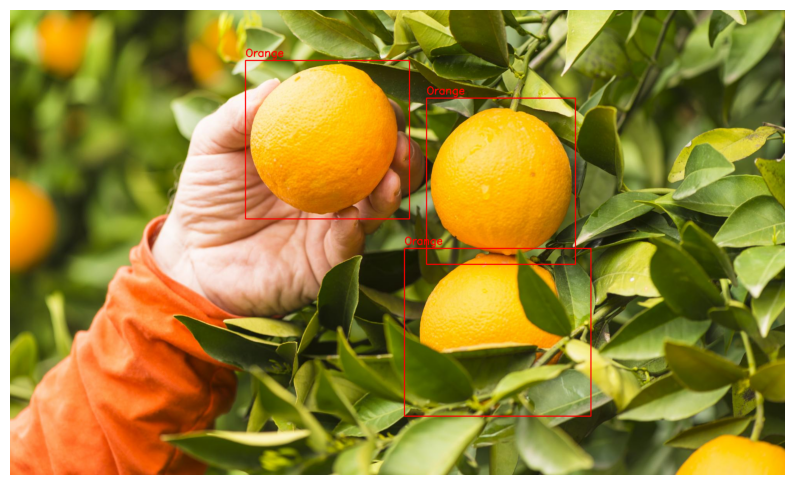

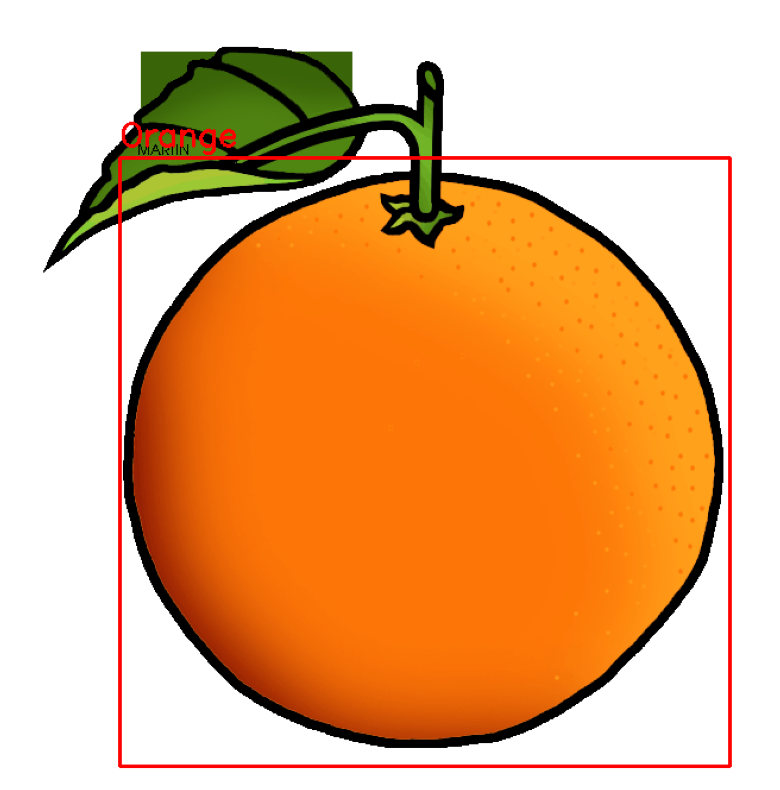

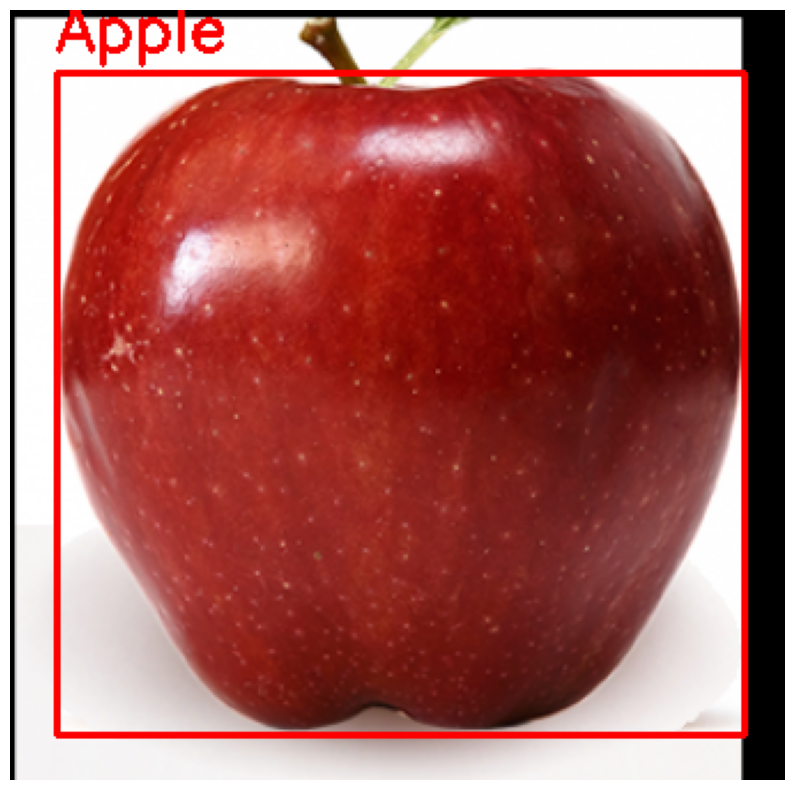

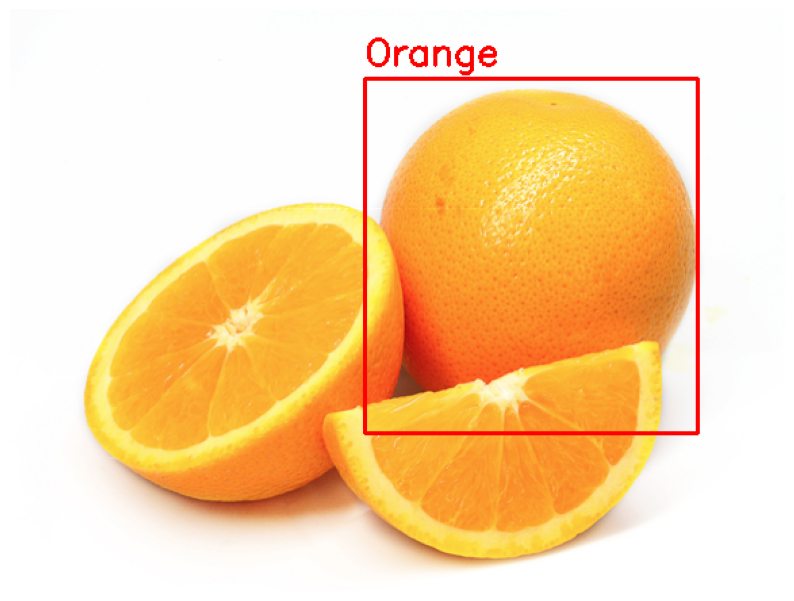

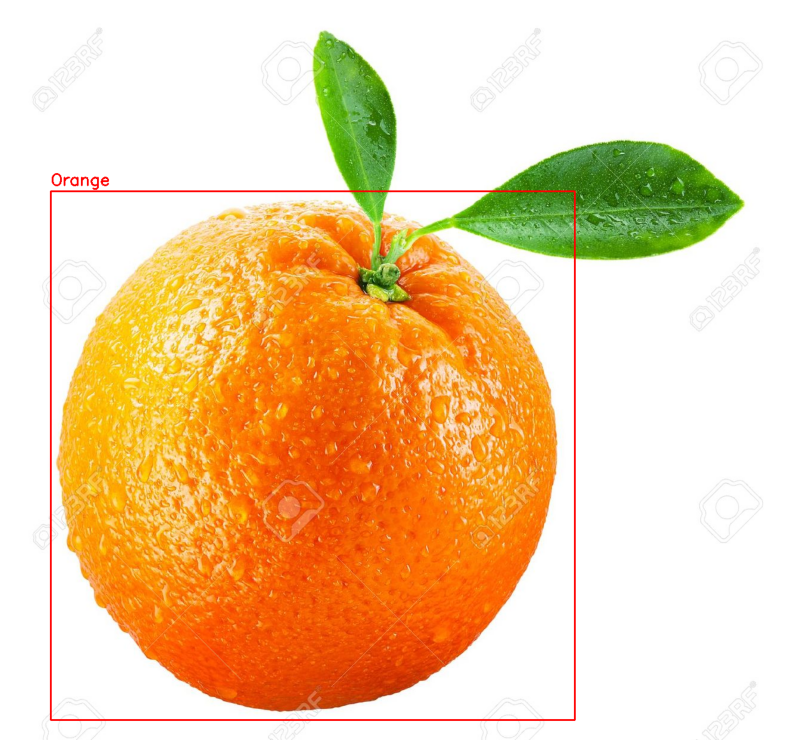

...

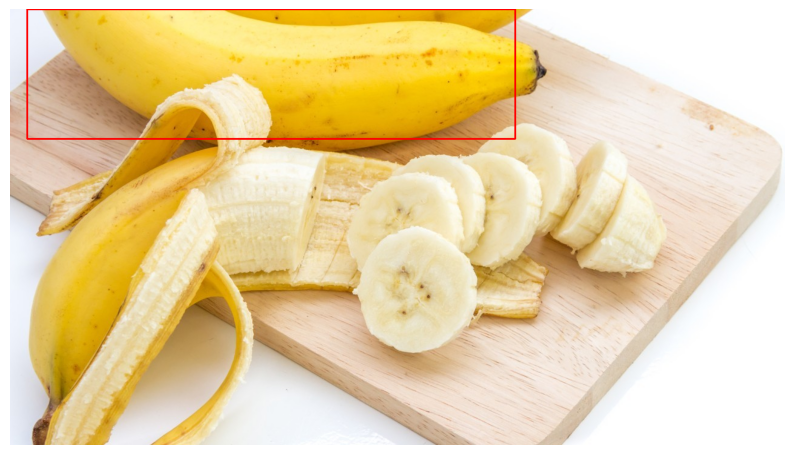

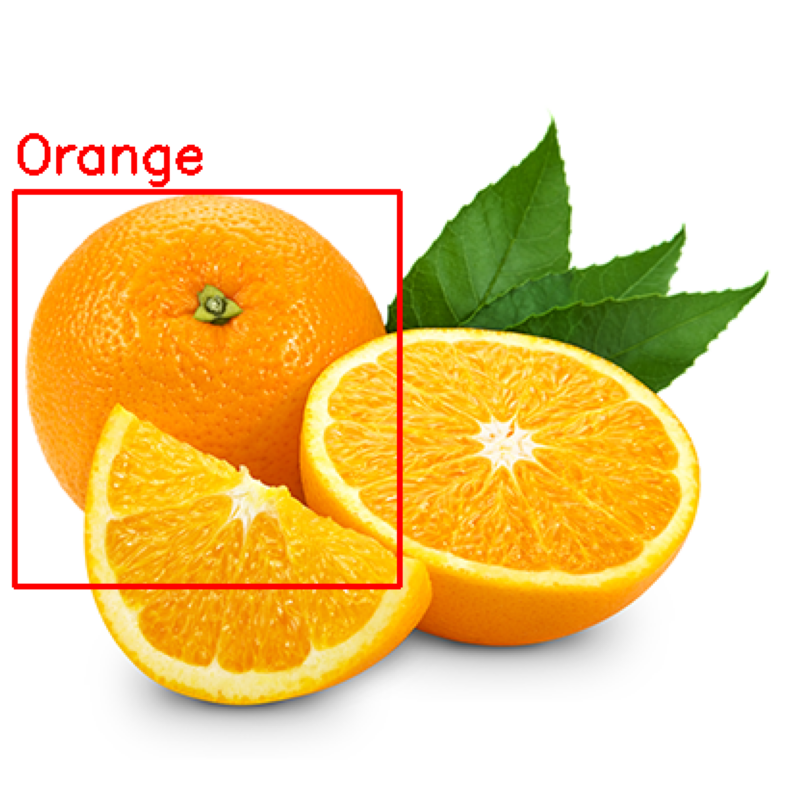

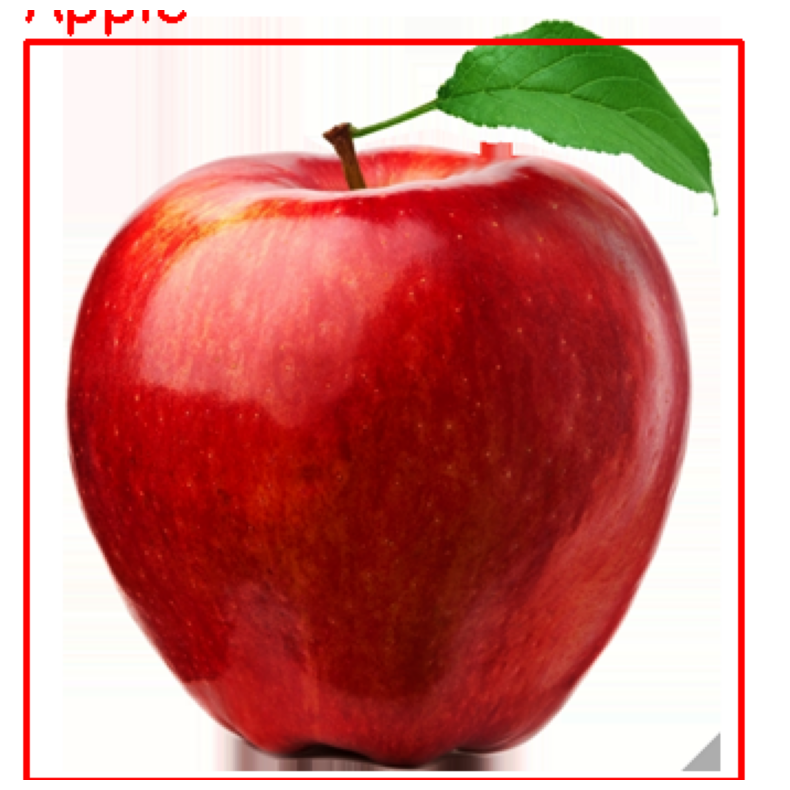

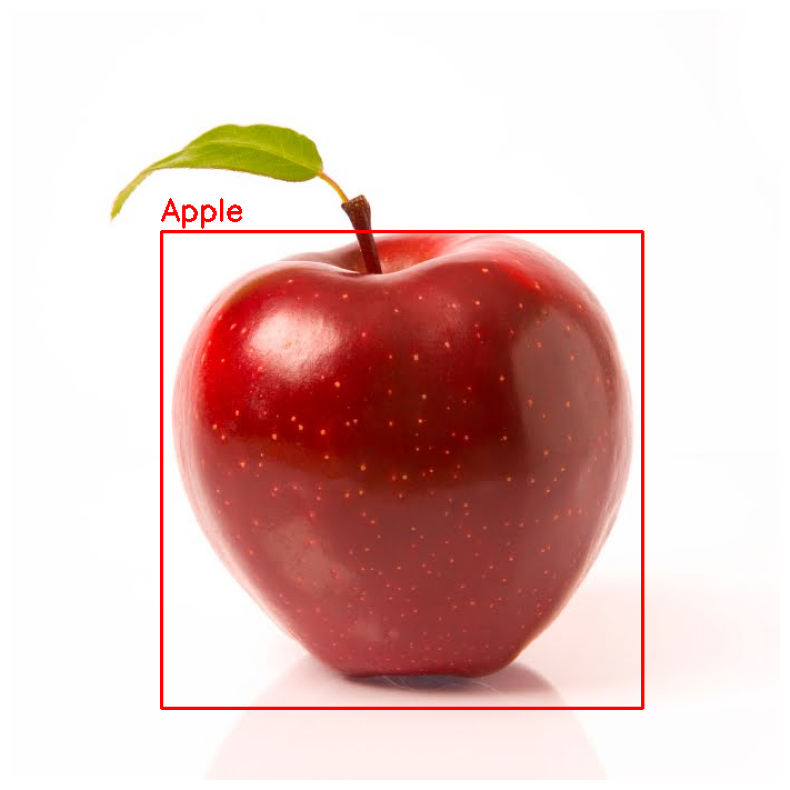

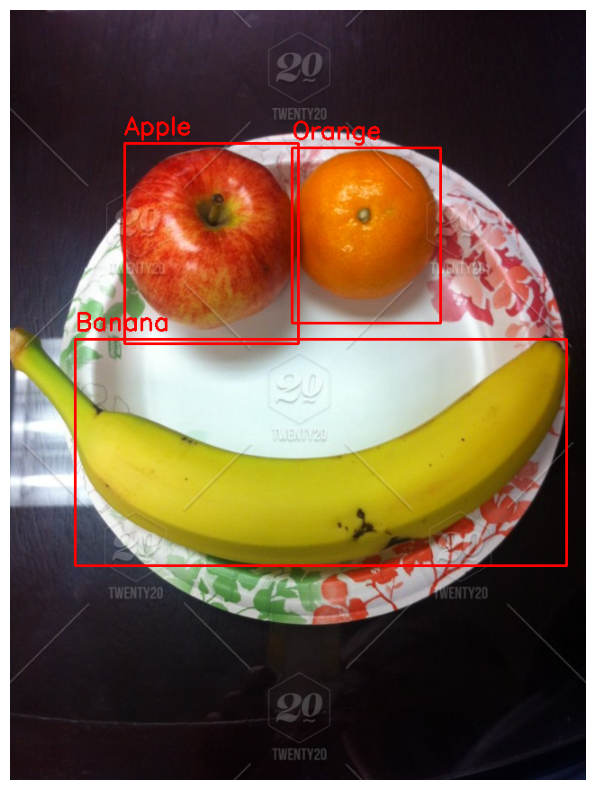

In [10]:
for image_file in random_images:
    image_path = os.path.join(train_images_path, image_file)
    label_file = os.path.join(train_labels_path, image_file.replace('.jpg', '.txt'))

    draw_bboxes(
        image_path,
        label_file,
        class_names,
        save_path=output_folder   # <--- gambar otomatis disimpan
    )

now download Yolov5 model from github

In [ ]:
# !git clone https://github.com/ultralytics/yolov5


Cloning into 'yolov5'...
remote: Enumerating objects: 17129, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 17129 (delta 32), reused 10 (delta 10), pack-reused 17080 (from 4)
Receiving objects: 100% (17129/17129), 15.84 MiB | 15.38 MiB/s, done.
Resolving deltas: 100% (11744/11744), done.


In [ ]:
!git clone https://github.com/ultralytics/yolov5 /content/drive/MyDrive/Yolo_Object-Detection/yolov5


fatal: destination path '/content/drive/MyDrive/Yolo_Object-Detection/yolov5' already exists and is not an empty directory.


In [ ]:
!python drive/MyDrive/Yolo_Object-Detection/yolov5/train.py --img 720 --batch 16 --epochs 50 --data /content/drive/MyDrive/Yolo_Object-Detection/dataset_config.yaml --weights yolov5s.pt --device 0


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-01-15 08:04:03.569923: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-15 08:04:03.590120: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-15 08:04:03.597773: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: sandking (sandking-google). Use `wandb login --relogin` to for

In [ ]:
print('Congrats')

Congrats
